# Latent space

## Kernel PCA (linear)

### imports & functions

In [1]:
import numpy as np
import matplotlib.pyplot as plt
import time
from collections import defaultdict
import itertools
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import sklearn
import sys,os
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/CAMELS/MIEST/utils/"))
from imp import reload 
# Change in mymodule/'
import vib_utils
reload(vib_utils)
from vib_utils import *
import mist_utils
reload(mist_utils)
from mist_utils import *
import umap_utils
reload(umap_utils)
from umap_utils import *
from matplotlib.legend import Legend
from matplotlib.lines import Line2D
import warnings
warnings.filterwarnings('ignore')

# Device Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
import plt_utils as pu
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
# Dimension reduction and clustering libraries
import umap
import umap.plot
#import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestRegressor
from sklearn import manifold
from plt_utils import generateAxesForMultiplePlots
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['font.family']='serif'
from sklearn.decomposition import KernelPCA

AttributeError: module 'matplotlib.pyplot' has no attribute 'register_cmap'

In [ ]:
#index    = np.logical_and(params[:,0]>0.3,params[:,1]>0.8)
#index    = np.logical_and(params[:,0]<0.3,params[:,1]<0.8)
def get_data(data, label, params, index=None):
    if None:
        tdata   = data
        tlabel  = label
        tparams = params
    else:
        tdata     = data[index,:]
        tlabel    = label[index]
        tparams   = params[index,:]
    
    rdata   = [tdata[tlabel=='r'], 
               tdata[tlabel=='b'], 
               tdata[tlabel=='g'],
               tdata[tlabel=='m']]
    rparams = [tparams[tlabel=='r'], 
               tparams[tlabel=='b'], 
               tparams[tlabel=='g'],
               tparams[tlabel=='m']]
    rlabel  = [tlabel[tlabel=='r'], 
               tlabel[tlabel=='b'], 
               tlabel[tlabel=='g'],
               tlabel[tlabel=='m']]
    return rdata, rlabel, rparams

# Function to rotate points around a given center
def rotate(points, angle, center=(0, 0)):
    """
    Rotate a set of points around a center by a given angle.

    :param points: Array of points (N, 2).
    :param angle: Angle in degrees to rotate.
    :param center: Center of rotation (default is origin (0, 0)).
    :return: Rotated points.
    """
    angle_rad = np.radians(angle)  # Convert angle to radians
    rotation_matrix = np.array([
        [np.cos(angle_rad), -np.sin(angle_rad)],
        [np.sin(angle_rad),  np.cos(angle_rad)]
    ])
    
    # Translate points back to the origin for rotation
    translated_points = points - center
    
    # Apply rotation
    rotated_points = np.dot(translated_points, rotation_matrix.T)
    
    # Translate points back to the original center
    rotated_points += center
    
    return rotated_points

### HI

#### TNG vs SIMBA

##### dataload (train)

In [ ]:
data   = [data_zero,   data_low,   data_mid,   data_high]
label  = [label_zero,  label_low,  label_mid,  label_high]
params = [params_zero, params_low, params_mid, params_high]
lv = 0
tdata, tlabel, tparams = get_data(data[lv], label[lv], params[lv])

fit_data    = np.r_[tdata[0], tdata[1]]
trans_data  = [tdata[0], tdata[1]]
#trans_label = np.append(tlabel[0], tlabel[1])
trans_param = [tparams[0], tparams[1]]
transformer = KernelPCA(n_components=3, kernel='linear')
transformer.fit(fit_data)
res_data = [transformer.transform(trans_data[0]),
            transformer.transform(trans_data[1])]

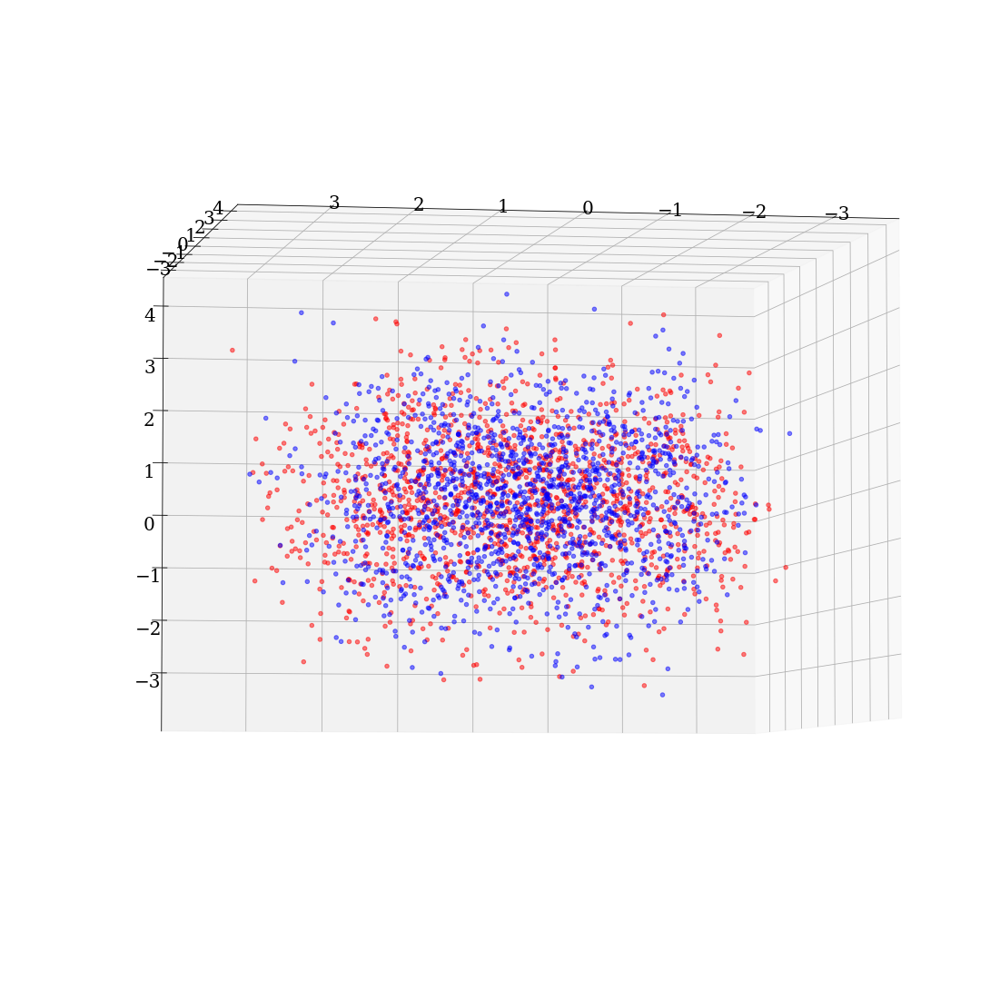

In [170]:
from mpl_toolkits.mplot3d import Axes3D
# Create a 3D plot
fig = plt.figure(figsize=(20,20))
ax = fig.add_subplot(111, projection='3d')
x=res_data[1][:,0]
y=res_data[1][:,1]
z=res_data[1][:,2]
# Plot the surface
ax.scatter(x, y, z, c='r', marker='o',alpha=0.5)
x=res_data[0][:,0]
y=res_data[0][:,1]
z=res_data[0][:,2]
ax.scatter(x, y, z, c='b', marker='o',alpha=0.5)
ax.view_init(elev=-4, azim=80)

In [183]:
data   = [data_zero,   data_low,   data_mid,   data_high]
label  = [label_zero,  label_low,  label_mid,  label_high]
params = [params_zero, params_low, params_mid, params_high]
lv = 0
tdata, tlabel, tparams = get_data(data[lv], label[lv], params[lv])

fit_data    = np.r_[tdata[0], tdata[1]]
trans_data  = [tdata[0], tdata[1]]
#trans_label = np.append(tlabel[0], tlabel[1])
trans_param_zero = [tparams[0], tparams[1]]
transformer = KernelPCA(n_components=3, kernel='linear')
transformer.fit(fit_data)
res_data_zero = [transformer.transform(trans_data[0]),
                transformer.transform(trans_data[1])]

data   = [data_zero,   data_low,   data_mid,   data_high]
label  = [label_zero,  label_low,  label_mid,  label_high]
params = [params_zero, params_low, params_mid, params_high]
lv = 3
tdata, tlabel, tparams = get_data(data[lv], label[lv], params[lv])

fit_data    = np.r_[tdata[0], tdata[1]]
trans_data  = [tdata[0], tdata[1]]
#trans_label = np.append(tlabel[0], tlabel[1])
trans_param_high = [tparams[0], tparams[1]]
transformer = KernelPCA(n_components=3, kernel='linear')
transformer.fit(fit_data)
res_data_high = [transformer.transform(trans_data[0]),
                transformer.transform(trans_data[1])]

In [3]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
study_names = ["HI_cnn_enc_dec_zero_monopole_1","HI_cnn_zero_monopole_1_new","HI_cnn_zero_monopole_1_new_split"]
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'


combinations = list(itertools.combinations(sims, 2))
externals = [[x for x in sims if x not in comb] for comb in combinations]
data   = list()
params = list()
label  = list()
for i, comb in enumerate(combinations):
    for fname in study_names:
        study_name = f"{comb[0]}_{comb[1]}_" + fname
        storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        print(path, comb)
        if os.path.isfile(path):
            print("file exists!")
            vib_umap = UMAP(sim=list(comb),field=field,study_name=study_name, fpath=fpath)#, ext_sim='ASTRID')
            data.append(vib_umap.Z_train)
            params.append(vib_umap.y_train_param)
            label.append(vib_umap.ylabel)
            import torch
            torch.cuda.empty_cache()
            import gc
            gc.collect()
            break
            

/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_SIMBA_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'SIMBA')
file exists!
The AUC score is 0.9782811614494783.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_ASTRID_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'ASTRID')
file exists!
The AUC score is 0.5372970630396373.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'EAGLE')
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_zero_monopole_1_new.db ('TNG', 'EAGLE')
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_zero_monopole_1_new_split.db ('TNG', 'EAGLE')
file exists!
The AUC score is 0.7746607994132746.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/SIMBA_ASTRID_HI_cnn_enc_dec_zero_monopole_1.db ('SIMBA', 'ASTRID')
file exists!
The AUC score is 0.8062589592292563.
(3

##### dataload (test)

In [5]:
sims = ['TNG', 'SIMBA', 'ASTRID', 'EAGLE']; field='HI'
study_names = ["HI_cnn_enc_dec_zero_monopole_1","HI_cnn_zero_monopole_1_new","HI_cnn_zero_monopole_1_new_split"]
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'


combinations = list(itertools.combinations(sims, 2))
externals = [[x for x in sims if x not in comb] for comb in combinations]
data   = list()
params = list()
label  = list()
for i, comb in enumerate(combinations):
    for fname in study_names:
        study_name = f"{comb[0]}_{comb[1]}_" + fname
        storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        path       = f"/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
        print(path, comb)
        if os.path.isfile(path):
            print("file exists!")
            vib_umap = UMAP(sim=list(comb),field=field,study_name=study_name, fpath=fpath)#, ext_sim='ASTRID')
            data.append(vib_umap.Z_test)
            params.append(vib_umap.y_test_param)
            label.append(vib_umap.clabel)
            import torch
            torch.cuda.empty_cache()
            import gc
            gc.collect()
            break
            

/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_SIMBA_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'SIMBA')
file exists!
The AUC score is 0.9835000166683336.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_ASTRID_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'ASTRID')
file exists!
The AUC score is 0.5436943694369437.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_enc_dec_zero_monopole_1.db ('TNG', 'EAGLE')
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_zero_monopole_1_new.db ('TNG', 'EAGLE')
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/TNG_EAGLE_HI_cnn_zero_monopole_1_new_split.db ('TNG', 'EAGLE')
file exists!
The AUC score is 0.79988832216555.
(3000, 2)
/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/SIMBA_ASTRID_HI_cnn_enc_dec_zero_monopole_1.db ('SIMBA', 'ASTRID')
file exists!
The AUC score is 0.828081141447478.
(3000

#### dimensionality reduction

In [27]:
PCA = False; metric='canberra'
trans_param = list()
res_data    = list()
for i in range(len(combinations)):
    tdata, tlabel, tparams = get_data(data[i], label[i], params[i])
    
    fit_data    = np.r_[tdata[0], tdata[1]]
    trans_data  = [tdata[0], tdata[1]]
    #trans_label = np.append(tlabel[0], tlabel[1])
    trans_param.append([tparams[0], tparams[1]])
    
    if PCA:
        transformer = KernelPCA(n_components=3, kernel='linear')
        transformer.fit(fit_data)
        res_data.append([transformer.transform(trans_data[0]),
                         transformer.transform(trans_data[1])])
    else:
        embedding = umap.UMAP(n_neighbors=20,
                              min_dist=0.5,
                              n_components=3,
                              random_state=3,
                               metric=metric)
        mapper    = embedding.fit(fit_data)
        res_data.append([embedding.transform(trans_data[0]),
                         embedding.transform(trans_data[1])])

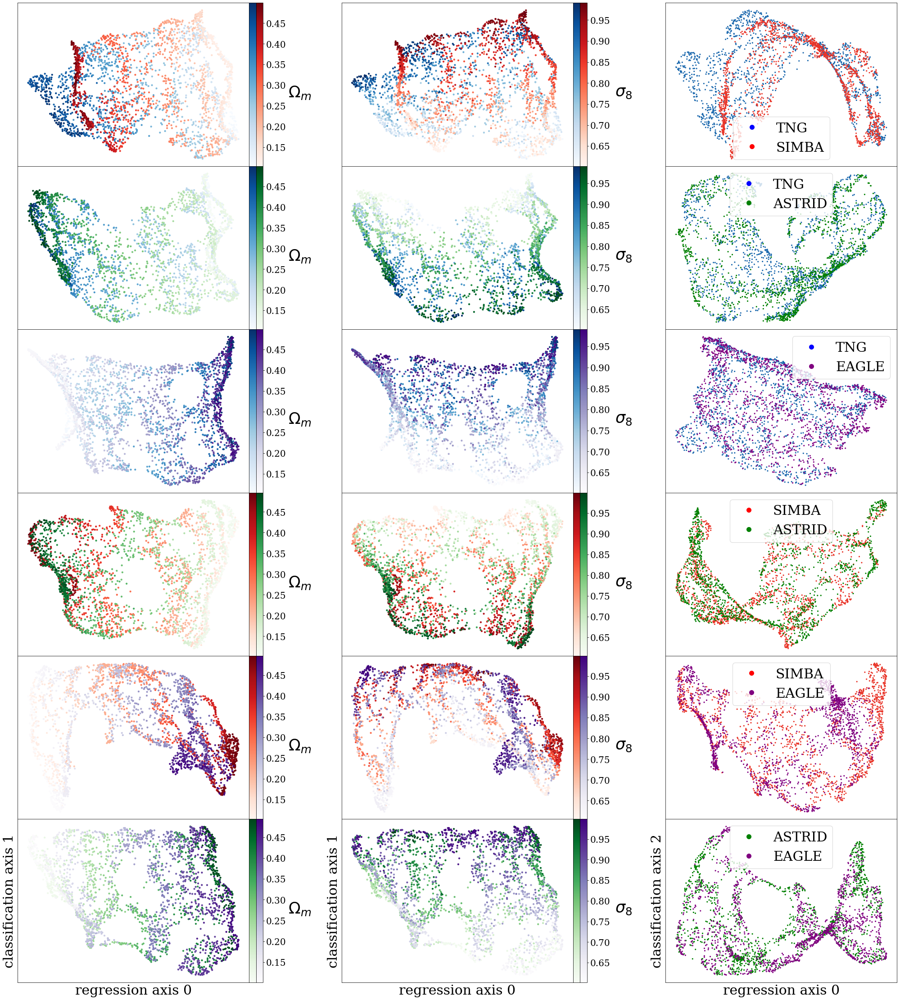

In [28]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
X=3; Y=len(combinations)
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(35,40),
                                      hspace=0.000,wspace=0.4)
ij = [[0,1],[0,1],[0,2]]

colors = {'TNG':'b','SIMBA':'r','ASTRID':'g','EAGLE':'purple'}#,'TNG':'b','TNG':'b'}
cmaps  = {'TNG':'Blues','SIMBA':'Reds','ASTRID':'Greens','EAGLE':'Purples'}
fcs    = {'TNG':"#1967ad",'SIMBA':"#e93529",'ASTRID':'g','EAGLE':'purple'}
s = 10
alpha=1.0
angles=[0,30,90,-30,0,0]
for j in range(Y):
    res_data0    = res_data[j]
    trans_param0 = trans_param[j]
    tax=[]
    sax=[]
    for i in range(2):
        tax.append(axes[i,j].scatter(res_data0[0][:,ij[i][0]], res_data0[0][:,ij[i][1]],
                          c=trans_param0[0][:,i], cmap=cmaps[combinations[j][0]], alpha=alpha,s=s))
        sax.append(axes[i,j].scatter(res_data0[1][:,ij[i][0]], res_data0[1][:,ij[i][1]],
                          c=trans_param0[1][:,i], cmap=cmaps[combinations[j][1]], alpha=alpha,s=s))
        
        axes[i,j].set_xticks([])
        axes[i,j].set_yticks([])
        
        if j == Y-1:
            axes[i,j].set_xlabel(f"regression axis {ij[i][0]}")
            axes[i,j].set_ylabel(f"classification axis {ij[i][1]}")
        
    
    
    i=2
    xx = rotate(res_data0[0][:,:2],angles[j])
    axes[i,j].scatter(xx[:,0], res_data0[0][:,ij[i][1]], edgecolors="None",facecolors=fcs[combinations[j][0]], alpha=alpha,s=s)
    xx = rotate(res_data0[1][:,:2],angles[j])
    axes[i,j].scatter(xx[:,0], res_data0[1][:,ij[i][1]], edgecolors="None",facecolors=fcs[combinations[j][1]], alpha=alpha,s=s)
    
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])

    if j == Y-1:
        axes[i,j].set_xlabel(f"regression axis {ij[i][0]}")
        axes[i,j].set_ylabel(f"classification axis {ij[i][1]}")
    
    
    scat = [Line2D([0],[0], c=colors[combinations[j][0]], marker='.', linestyle='None',markersize=20),
            Line2D([0],[0], c=colors[combinations[j][1]], marker='.', linestyle='None',markersize=20),]
    #axes.legend(lines, [f'{time:.0f}' for time in sc_time],
    #                bbox_to_anchor=(0.999, 0.999))
    axes[2,j].legend(scat,[combinations[j][0],combinations[j][1]])
    axins_l = inset_axes(axes[0,j],
                 width="100%",  # width = 5% of parent_bbox width
                 height="100%",  # height : 50%
                 loc='lower left',
                 bbox_to_anchor=(1.0, 0., 0.03, 1.00),
                 bbox_transform=axes[0,j].transAxes,
                 borderpad=0.0,
                )
    cbar_dens=plt.colorbar(tax[0], cax=axins_l, orientation='vertical', aspect='auto')
    cbar_dens.ax.yaxis.set_ticks([])
    axins_l = inset_axes(axes[0,j],
                 width="100%",  # width = 5% of parent_bbox width
                 height="100%",  # height : 50%
                 loc='lower left',
                 bbox_to_anchor=(1.03, 0., 0.03, 1.00),
                 bbox_transform=axes[0,j].transAxes,
                 borderpad=0.0,
                )
    cbar_dens=plt.colorbar(sax[0], cax=axins_l, orientation='vertical', aspect='auto')
    cbar_dens.ax.yaxis.set_ticks_position('right')
    cbar_dens.set_label(r"$\Omega_m$", labelpad=30, fontsize=35)
    cbar_dens.ax.yaxis.label.set_rotation(0)
    #axes[1,0].legend(scat,['TNG','SIMBA'])
    axins_l = inset_axes(axes[1,j],
                 width="100%",  # width = 5% of parent_bbox width
                 height="100%",  # height : 50%
                 loc='lower left',
                 bbox_to_anchor=(1.0, 0., 0.03, 1.00),
                 bbox_transform=axes[1,j].transAxes,
                 borderpad=0.0,
                )
    cbar_dens=plt.colorbar(tax[1], cax=axins_l, orientation='vertical', aspect='auto')
    cbar_dens.ax.yaxis.set_ticks([])
    axins_l = inset_axes(axes[1,j],
                 width="100%",  # width = 5% of parent_bbox width
                 height="100%",  # height : 50%
                 loc='lower left',
                 bbox_to_anchor=(1.03, 0., 0.03, 1.00),
                 bbox_transform=axes[1,j].transAxes,
                 borderpad=0.0,
                )
    cbar_dens=plt.colorbar(sax[1], cax=axins_l, orientation='vertical', aspect='auto')
    cbar_dens.ax.yaxis.set_ticks_position('right')
    cbar_dens.set_label(r"$\sigma_8$", labelpad=30, fontsize=35)
    cbar_dens.ax.yaxis.label.set_rotation(0)
#axes[0,0].set_title(r"$\Omega_\mathrm{m}$", fontsize=35)
#axes[1,0].set_title(r"$\sigma_8$", fontsize=35)
#plt.text(-87,0.85, 'No Robustness', rotation=90, fontsize=35, verticalalignment='bottom')
#plt.text(-87,0.65, 'With Robustness', rotation=90, fontsize=35, verticalalignment='bottom')
plt.savefig(f'paper_plot/combinatory_all_zero_umap_test_{metric}.png', dpi=200, bbox_inches='tight')

## imports

In [3]:
import numpy as np
import matplotlib.pyplot as plt
import time
from collections import defaultdict

import sklearn
import sys,os
sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/CAMELS/MIEST/utils/"))
from imp import reload 
# Change in mymodule/'
import vib_utils
reload(vib_utils)
from vib_utils import *
import mist_utils
reload(mist_utils)
from mist_utils import *
import umap_utils
reload(umap_utils)
from umap_utils import *


import warnings
warnings.filterwarnings('ignore')

# Device Config
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

sys.path.append(os.path.abspath("/mnt/home/yjo10/ceph/myutils/"))
import plt_utils as pu
from plt_utils import generateAxesForMultiplePlots, remove_inner_axes
# Dimension reduction and clustering libraries
import umap
import umap.plot
#import hdbscan
import sklearn.cluster as cluster
from sklearn.metrics import adjusted_rand_score, adjusted_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.datasets import make_classification
from sklearn.ensemble import RandomForestRegressor
from sklearn import manifold
from plt_utils import generateAxesForMultiplePlots
from mpl_toolkits.mplot3d import Axes3D
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
plt.rcParams['font.family']='serif'
from sklearn.decomposition import KernelPCA

## HI

### TNG vs SIMBA

#### Dataload

In [4]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_zero_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_zero = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_zero = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=4.752%, R2 score=0.977,chi2=0.317, bias=-0.002
$\sigma_8$: MSE=0.002, % error=4.533%, R2 score=0.853,chi2=0.704, bias=-0.000
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=13.943%, R2 score=0.847,chi2=2.136, bias=-0.023
$\sigma_8$: MSE=0.029, % error=20.315%, R2 score=-1.200,chi2=10.173, bias=-0.144


In [5]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_low_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_low = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_low = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=4.159%, R2 score=0.978,chi2=0.408, bias=0.001
$\sigma_8$: MSE=0.002, % error=4.492%, R2 score=0.852,chi2=0.796, bias=0.000
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=13.082%, R2 score=0.859,chi2=2.606, bias=-0.028
$\sigma_8$: MSE=0.015, % error=13.459%, R2 score=-0.104,chi2=5.769, bias=-0.077


In [6]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_mid_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_mid = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_mid = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=5.063%, R2 score=0.970,chi2=0.790, bias=0.002
$\sigma_8$: MSE=0.003, % error=5.494%, R2 score=0.782,chi2=0.898, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.001, % error=10.737%, R2 score=0.908,chi2=2.509, bias=-0.018
$\sigma_8$: MSE=0.017, % error=14.453%, R2 score=-0.288,chi2=5.232, bias=-0.096


In [7]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_high_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_high = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_high = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=9.399%, R2 score=0.927,chi2=1.266, bias=-0.003
$\sigma_8$: MSE=0.005, % error=7.582%, R2 score=0.608,chi2=1.282, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.004, % error=19.722%, R2 score=0.716,chi2=7.455, bias=-0.046
$\sigma_8$: MSE=0.010, % error=10.698%, R2 score=0.262,chi2=2.195, bias=-0.029


In [25]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_high2_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_high2 = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_high2 = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.013, % error=44.046%, R2 score=-0.002,chi2=0.984, bias=-0.004
$\sigma_8$: MSE=0.013, % error=12.991%, R2 score=-0.000,chi2=1.003, bias=-0.003
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.013, % error=44.025%, R2 score=-0.000,chi2=1.010, bias=0.000
$\sigma_8$: MSE=0.013, % error=12.906%, R2 score=-0.000,chi2=1.008, bias=0.000


In [26]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_high3_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_high3 = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_high3 = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.013, % error=44.020%, R2 score=-0.002,chi2=0.982, bias=-0.004
$\sigma_8$: MSE=0.013, % error=13.010%, R2 score=-0.001,chi2=1.014, bias=-0.003
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.013, % error=43.992%, R2 score=0.000,chi2=1.007, bias=0.001
$\sigma_8$: MSE=0.013, % error=12.918%, R2 score=-0.000,chi2=1.018, bias=-0.001


#### plot for $\Omega_m$

##### old

NameError: name 'data_zero' is not defined

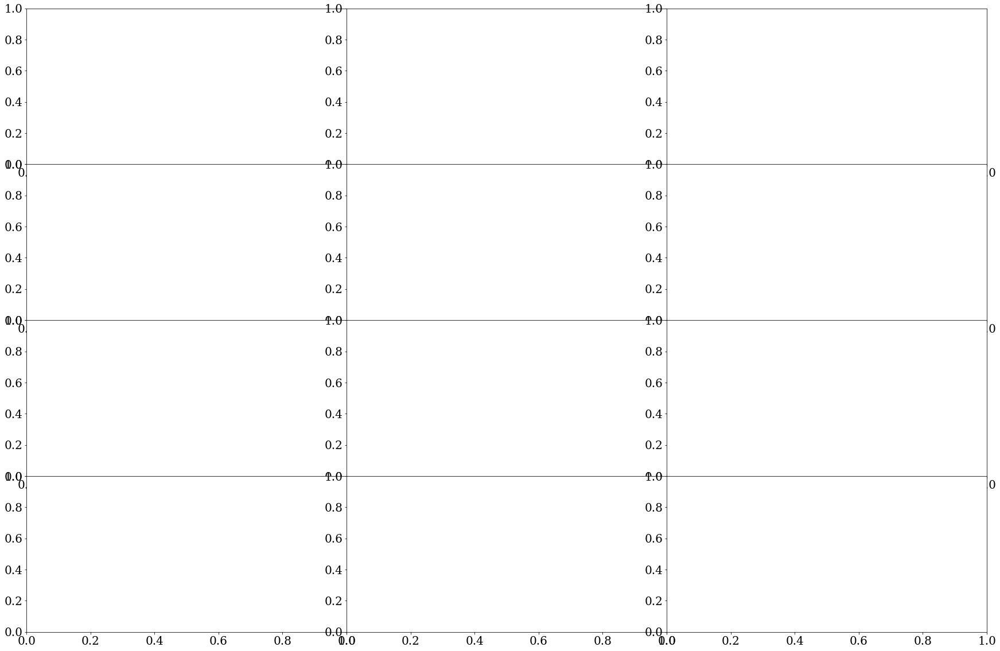

In [2]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4


gridspec = {"width_ratios":[]}

fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om.png',dpi=200, bbox_inches='tight')

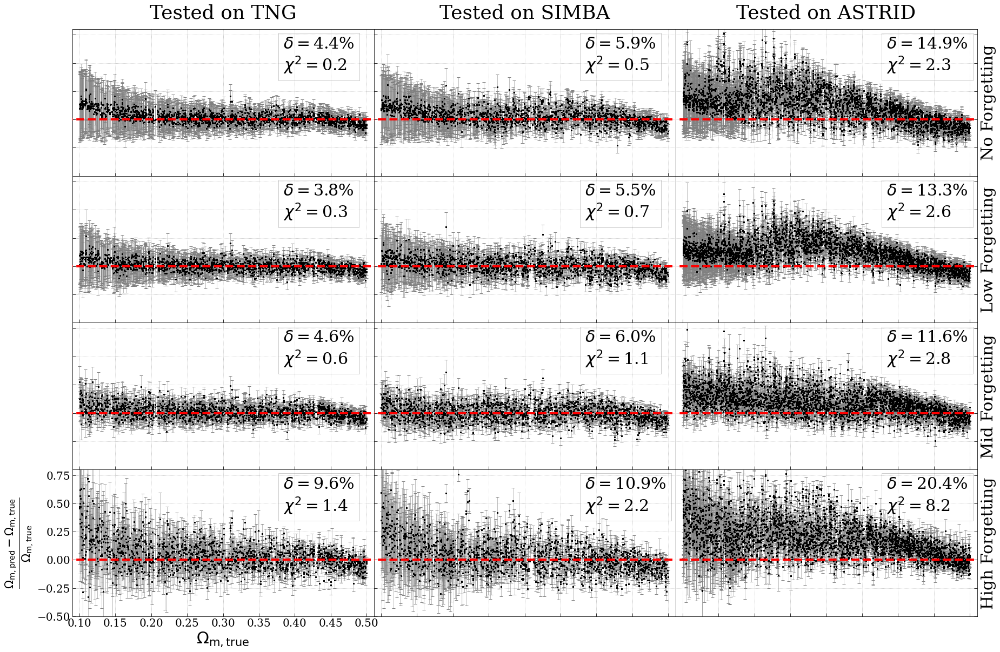

In [152]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om.png',dpi=200, bbox_inches='tight')

##### new

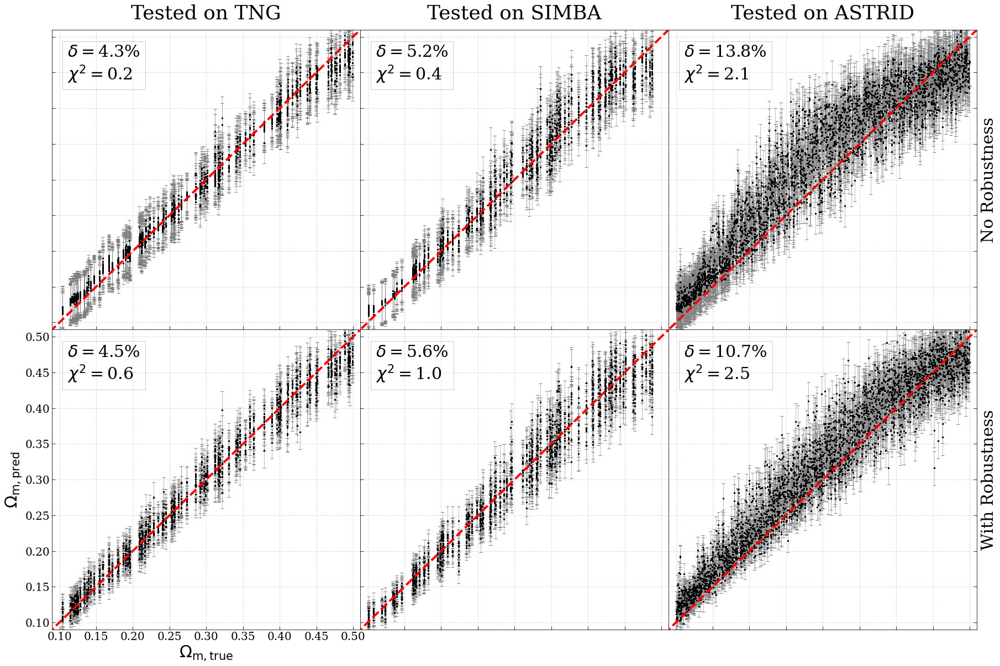

In [29]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.05, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(0.09,0.51)
        #axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_om_new.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

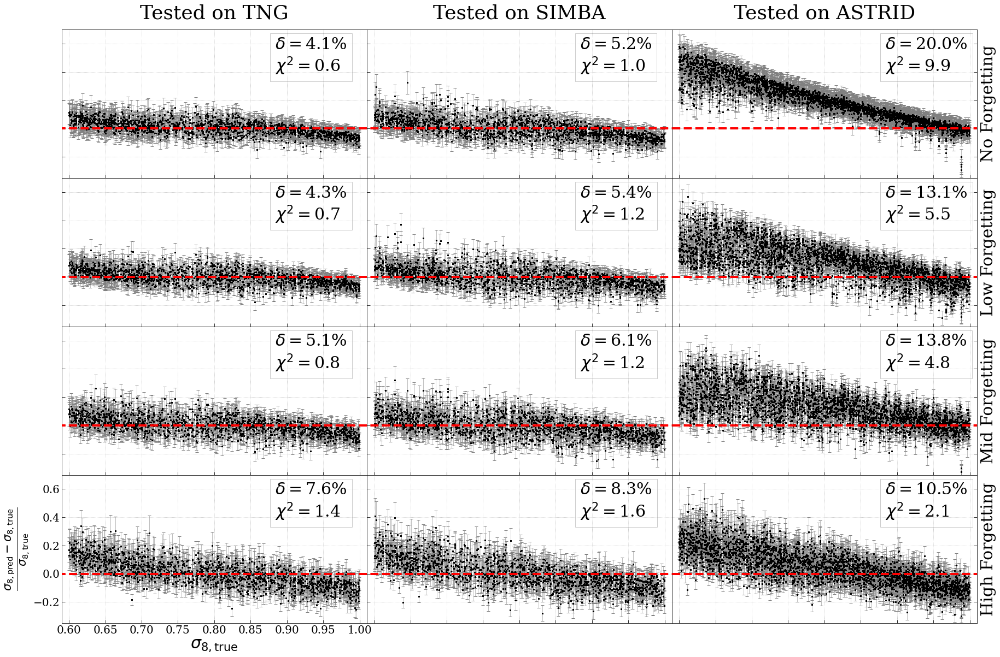

In [151]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,4
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high]
ast  = [ast_zero, ast_low, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(4):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_sig.png',dpi=200, bbox_inches='tight')

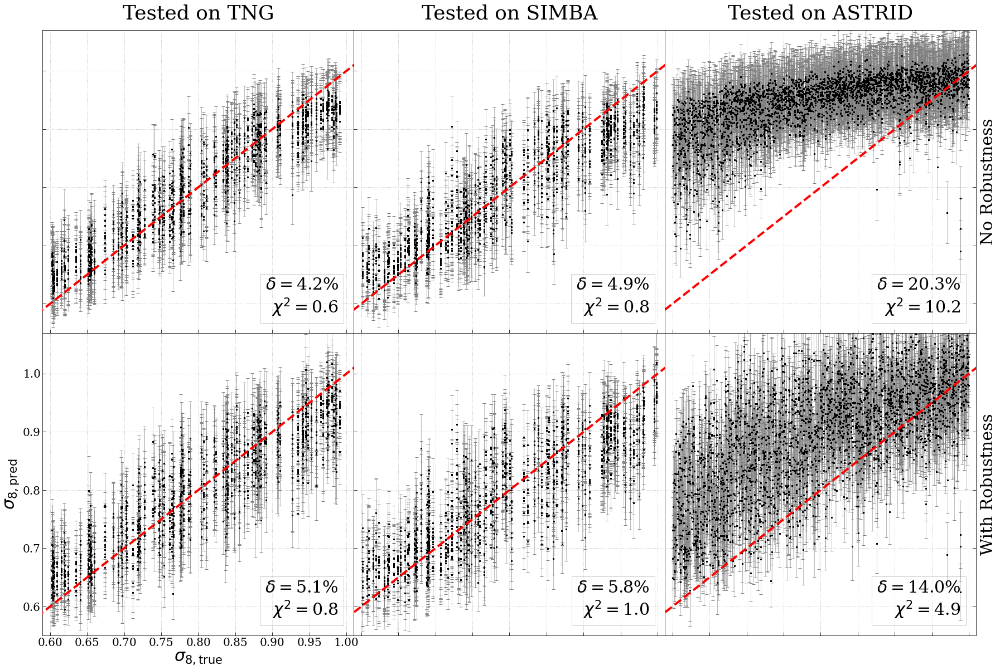

In [32]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.95, .05, text,
         ha='right', va='bottom', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\sigma_\mathrm{8, pred}$")
            #xes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(0.55,1.07)
        #axes[i,j].set_ylim(-.35,.7)

        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_HI_performance_sig_new.png',dpi=200, bbox_inches='tight')

#### Combine

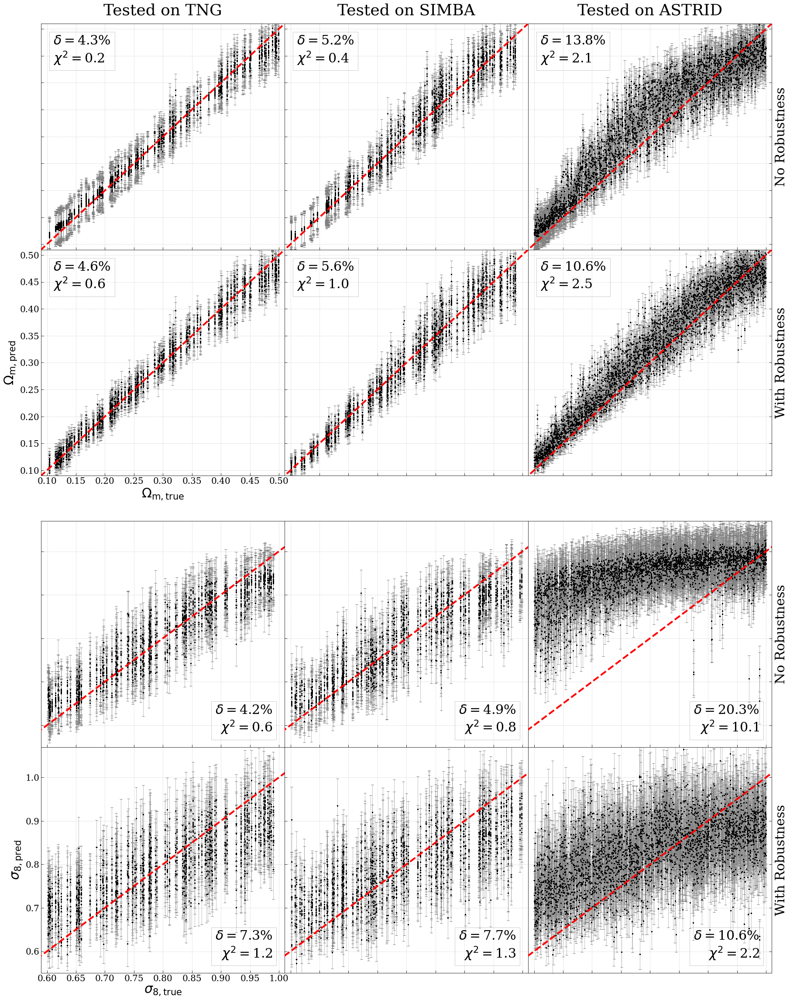

In [24]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,5
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,40),
                                      hspace=0.00,wspace=0.00, gridspec={"height_ratios":[1,1,0.2,1,1]})

for i in range(X):
    axes[i,2].get_xaxis().set_visible(False)
    axes[i,2].get_yaxis().set_visible(False)
    axes[i,2].axis("off")

#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid]
ast  = [ast_zero, ast_mid]
for i in range(X):
    for j in range(2):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.05, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == 1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\Omega_\mathrm{m, pred}$")
            #axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(0.09,0.51)
        #axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(2):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])


#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_high]
ast  = [ast_zero, ast_high]
for i in range(X):
    for j in range(2):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        axes[i,j+3].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j+3].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        #axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        axes[i,j+3].plot(ideal1,ideal1,"r",ls='--',lw=4,zorder=40)
        
        #rel_err = np.mean(np.abs(y_res))*100
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j+3].text(.95, .05, text,
         ha='right', va='bottom', transform=axes[i,j+3].transAxes,
         bbox=props)
        
        axes[i,j+3].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j+3].grid(ls=':')
        if j == 1 and i == 0:
            axes[i,j+3].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j+3].set_ylabel(r"$\sigma_\mathrm{8, pred}$")
            #xes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j+3].set_xticklabels([])
            axes[i,j+3].set_yticklabels([])
        axes[i,j+3].set_xlim(0.59,1.01)
        axes[i,j+3].set_ylim(0.55,1.07)
        #axes[i,j].set_ylim(-.35,.7)

        
#axes[0,0].set_title('Tested on TNG',pad=20)
#axes[1,0].set_title('Tested on SIMBA',pad=20)
#axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Robustness', 'With Robustness']
for i in range(2):
    axes[X-1,i+3].yaxis.set_label_position("right")
    axes[X-1,i+3].yaxis.tick_right()
    axes[X-1,i+3].set_ylabel(labels[i])

plt.savefig('paper_plot/TNG_SIMBA_HI_performance_combined_new.png',dpi=200, bbox_inches='tight')

#### Accuracy vs robustness

Text(0, 0.5, 'Relative Error of $\\sigma_8$ (%)')

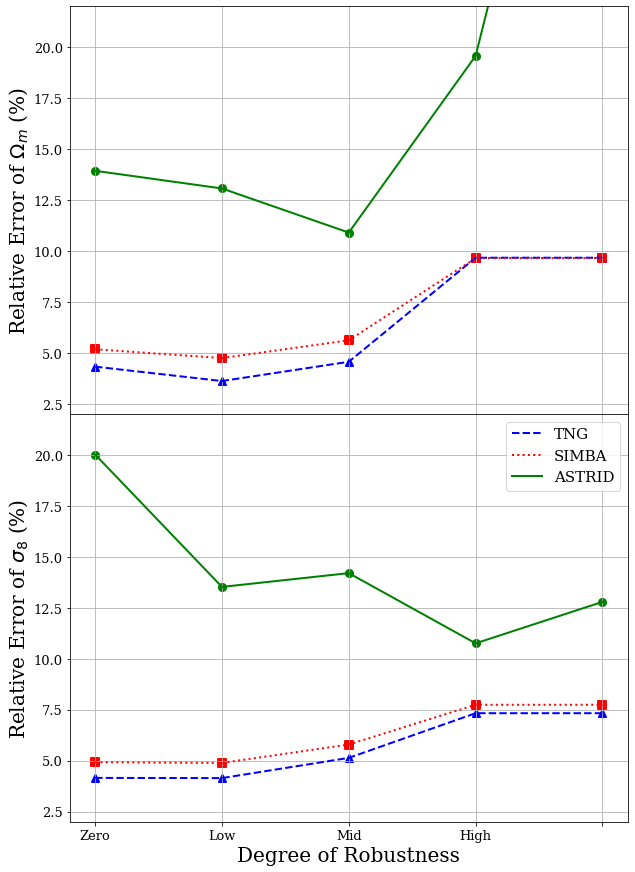

In [32]:
plt.rcParams['font.size'] = 20
plt.rcParams['axes.labelsize'] = 20
plt.rcParams['xtick.labelsize'] = 13
plt.rcParams['ytick.labelsize'] = 13
plt.rcParams['font.family']='serif'
X, Y = 1,2
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(10,15),
                                      hspace=0.00,wspace=0.001)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_low, data_mid, data_high, data_high]#2, data_high3]
ast  = [ast_zero, ast_low, ast_mid, ast_high, ast_high2] #, ast_high3]
rel_om = np.zeros((3,len(data)))
xi_om = np.zeros((3,len(data)))
X=3;Y=5;
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        rel_om[i,j] = rel_err
        xi_om[i,j]  = xi2

par = 1
rel_sig = np.zeros((3,len(data)))
xi_sig = np.zeros((3,len(data)))
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        #y_res     = (y_mean-y_true)/y_true
        #y_res_std = y_std/y_true
        y_res = y_mean
        y_res_std = y_std
        
        rel_err = np.mean(np.abs((y_mean-y_true)/y_true))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        rel_sig[i,j] = rel_err
        xi_sig[i,j]  = xi2
        
color = ['b','r','g']
ls = ["--",":","-"]
marker = ['^', 's', 'o']
for i in range(3):
    axes[0].plot(range(len(ast)), rel_om[i,:], c=color[i], lw=2, ls=ls[i])
    axes[0].scatter(range(len(ast)), rel_om[i,:], c=color[i], lw=2, marker=marker[i], s=50)
label = ['TNG', 'SIMBA', 'ASTRID']
for i in range(3):
    axes[1].plot(range(len(ast)), rel_sig[i,:], c=color[i], lw=2, label=label[i], ls=ls[i])
    axes[1].scatter(range(len(ast)), rel_sig[i,:], c=color[i], lw=2, marker=marker[i], s=50)
axes[0].set_ylim(2,22)
axes[1].set_ylim(2,22)
axes[0].grid()
axes[1].grid()
#axes[1].set_yticklabels([])
axes[0].set_xticklabels(['Zero', 'Low', 'Mid', 'High'])
axes[1].set_xticklabels(['Zero', 'Low', 'Mid', 'High'])
axes[0].set_xticks(range(len(ast)))
axes[1].set_xticks(range(len(ast)))
axes[1].legend(fontsize=15)
axes[1].set_xlabel("Degree of Robustness")
axes[0].set_ylabel("Relative Error of $\Omega_m$ (%)")
axes[1].set_ylabel("Relative Error of $\sigma_8$ (%)")
#axes[0].set_title("$\Omega_m$",fontsize=25)
#axes[1].set_title("$\sigma_8$",fontsize=25)
#plt.savefig('paper_plot/robust_relative_error.png',dpi=200, bbox_inches='tight')

### TNG vs ASTRID

#### Dataload

In [3]:
sim  = ['TNG', 'ASTRID']; field = 'HI'
study_name = 'TNG_ASTRID_HI_cnn_enc_dec_zero_monopole_1'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_zero = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_zero = mist.test_on_cnn('SIMBA', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=3.155%, R2 score=0.987,chi2=0.469, bias=0.000
$\sigma_8$: MSE=0.002, % error=3.909%, R2 score=0.887,chi2=1.061, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.006, % error=20.032%, R2 score=0.566,chi2=18.524, bias=0.035
$\sigma_8$: MSE=0.013, % error=11.392%, R2 score=0.061,chi2=8.378, bias=-0.030


In [ ]:
sim  = ['TNG', 'SIMBA']; field = 'HI'
study_name = "TNG_SIMBA_HI_cnn_enc_dec_low_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_low = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_low = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

In [4]:
sim  = ['TNG', 'ASTRID']; field = 'HI'
study_name = 'TNG_ASTRID_HI_cnn_mid_monopole_1_new'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_mid = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_mid = mist.test_on_cnn('SIMBA', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=4.741%, R2 score=0.977,chi2=0.569, bias=0.000
$\sigma_8$: MSE=0.003, % error=5.233%, R2 score=0.801,chi2=0.927, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.007, % error=21.307%, R2 score=0.444,chi2=13.903, bias=0.025
$\sigma_8$: MSE=0.021, % error=15.458%, R2 score=-0.591,chi2=6.889, bias=-0.093


In [5]:
sim  = ['TNG', 'ASTRID']; field = 'HI'
study_name = "TNG_ASTRID_HI_cnn_enc_dec_high_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_high = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_high = mist.test_on_cnn('SIMBA', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=5.608%, R2 score=0.970,chi2=0.756, bias=-0.000
$\sigma_8$: MSE=0.014, % error=13.041%, R2 score=0.002,chi2=1.030, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.006, % error=20.737%, R2 score=0.553,chi2=13.260, bias=0.041
$\sigma_8$: MSE=0.013, % error=12.868%, R2 score=0.005,chi2=1.035, bias=0.001


#### plot for $\Omega_m$

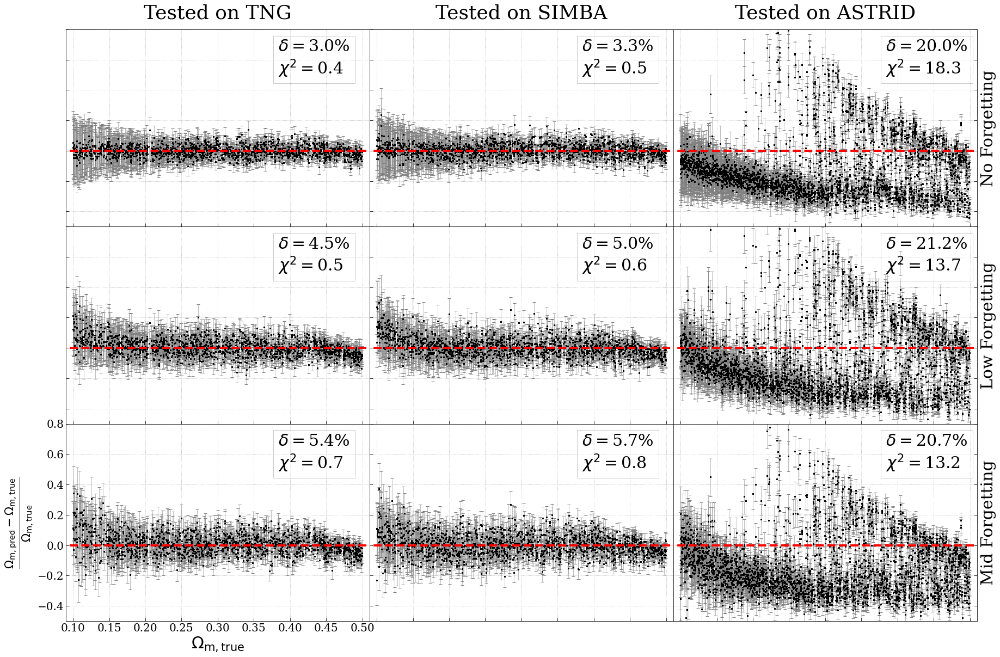

In [7]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_ASTRID_HI_performance_om.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

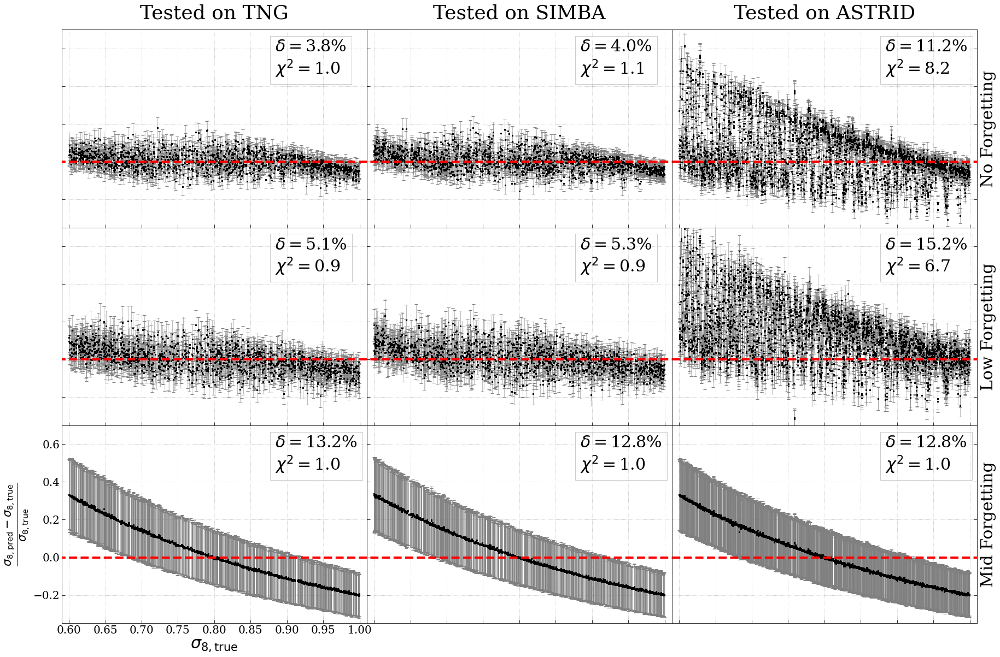

In [9]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_ASTRID_HI_performance_sig.png',dpi=200, bbox_inches='tight')

### SIMBA vs ASTRID

#### Dataload

In [11]:
sim  = ['SIMBA', 'ASTRID']; field = 'HI'
study_name = 'SIMBA_ASTRID_HI_cnn_enc_dec_zero_monopole_1'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_zero = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_zero = mist.test_on_cnn('TNG', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=4.272%, R2 score=0.975,chi2=0.425, bias=0.002
$\sigma_8$: MSE=0.002, % error=4.648%, R2 score=0.835,chi2=0.845, bias=0.004
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.006, % error=23.890%, R2 score=0.521,chi2=7.403, bias=-0.067
$\sigma_8$: MSE=0.032, % error=17.276%, R2 score=-1.385,chi2=13.092, bias=0.141


In [12]:
sim  = ['SIMBA', 'ASTRID']; field = 'HI'
study_name = 'SIMBA_ASTRID_HI_cnn_mid_monopole_1_new'
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_mid = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_mid = mist.test_on_cnn('TNG', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.000, % error=5.460%, R2 score=0.966,chi2=0.786, bias=-0.003
$\sigma_8$: MSE=0.003, % error=5.814%, R2 score=0.749,chi2=1.012, bias=0.001
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.005, % error=21.313%, R2 score=0.636,chi2=8.070, bias=-0.055
$\sigma_8$: MSE=0.017, % error=12.266%, R2 score=-0.302,chi2=6.420, bias=0.068


In [13]:
sim  = ['SIMBA', 'ASTRID']; field = 'HI'
study_name = "SIMBA_ASTRID_HI_cnn_enc_dec_high_monopole_1"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_high = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_high = mist.test_on_cnn('TNG', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=6.871%, R2 score=0.955,chi2=0.856, bias=0.000
$\sigma_8$: MSE=0.013, % error=12.876%, R2 score=0.006,chi2=1.003, bias=0.000
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.004, % error=20.488%, R2 score=0.664,chi2=5.569, bias=-0.054
$\sigma_8$: MSE=0.013, % error=12.920%, R2 score=-0.000,chi2=0.989, bias=-0.002


#### plot for $\Omega_m$

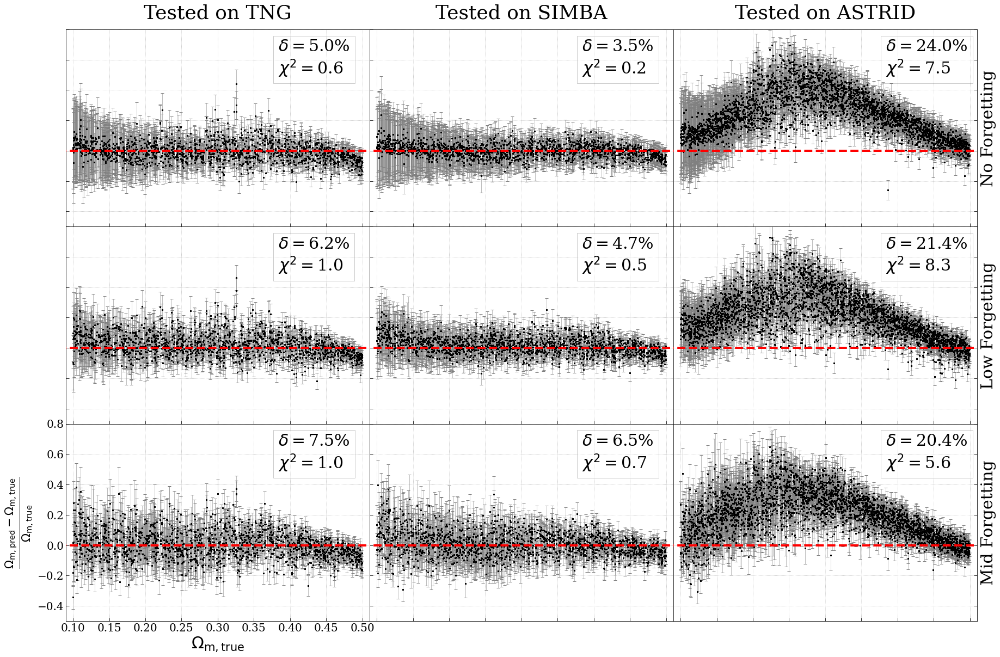

In [14]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/SIMBA_ASTRID_HI_performance_om.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

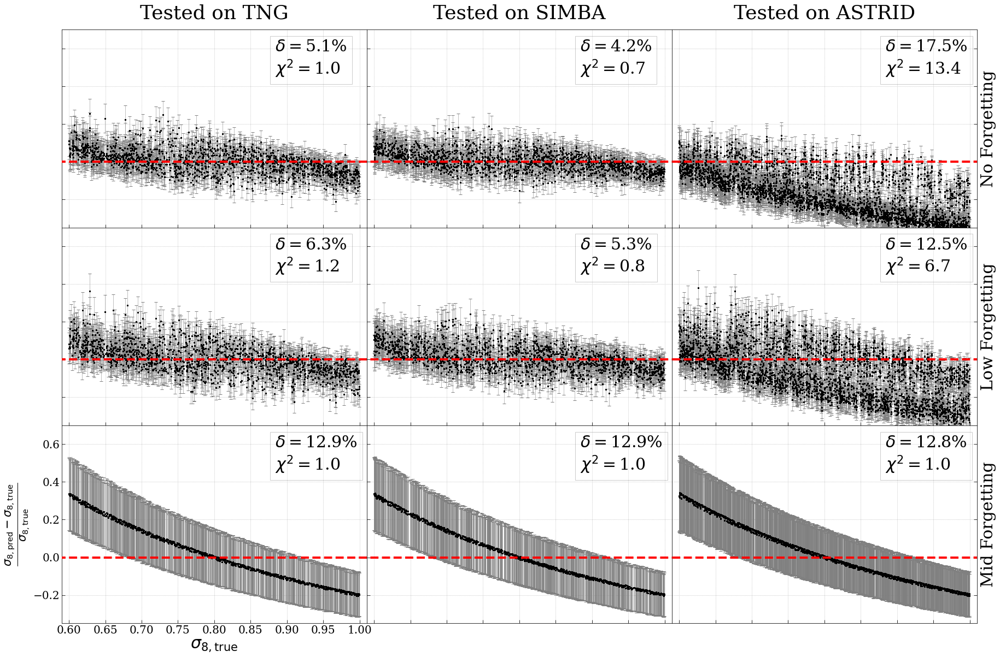

In [15]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/SIMBA_ASTRID_HI_performance_sig.png',dpi=200, bbox_inches='tight')

## T

### TNG vs SIMBA

#### Dataload

In [17]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_zero_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_zero = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_zero = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=5.750%, R2 score=0.955,chi2=0.712, bias=-0.002
$\sigma_8$: MSE=0.002, % error=4.689%, R2 score=0.828,chi2=0.943, bias=0.003
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=14.398%, R2 score=0.833,chi2=2.919, bias=-0.027
$\sigma_8$: MSE=0.021, % error=14.086%, R2 score=-0.596,chi2=9.963, bias=0.070


In [19]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_low_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_low = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_low = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=6.777%, R2 score=0.949,chi2=0.604, bias=-0.003
$\sigma_8$: MSE=0.002, % error=4.913%, R2 score=0.816,chi2=0.872, bias=-0.002
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.002, % error=12.552%, R2 score=0.875,chi2=1.608, bias=-0.013
$\sigma_8$: MSE=0.020, % error=13.746%, R2 score=-0.537,chi2=8.695, bias=0.075


In [20]:
sim  = ['TNG', 'SIMBA']; field = 'T'
study_name = "TNG_SIMBA_T_cnn_mid_monopole_1_new"
fpath = '/mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck'
storage    = f"sqlite:////mnt/home/yjo10/ceph/CAMELS/MIEST/information_bottleneck/database/{study_name}.db"
mist = MIST(sim=sim, field=field, batch_size=32, 
            data_type = 'image',
            normalization=True,
            monopole = True,
            device=device, robust_axis='sim')
mist.load_optuna_models(storage=storage,study_name=study_name, which_machine="cnn_enc_dec",num_trial=None, fpath=fpath)
mist.get_score_cnn()
data_mid = mist.make_plots_cnn(fname='cnn_test', save_plot=False, data_return=True,show_plot=False)
ast_mid = mist.test_on_cnn('ASTRID', show_score=True, data_return=True,show_plot=False)

$\Omega_m$: MSE=0.001, % error=6.683%, R2 score=0.949,chi2=0.864, bias=-0.004
$\sigma_8$: MSE=0.003, % error=5.188%, R2 score=0.789,chi2=0.973, bias=0.004
(15000, 1, 256, 256) (15000, 2)
$\Omega_m$: MSE=0.003, % error=18.737%, R2 score=0.739,chi2=10.644, bias=-0.040
$\sigma_8$: MSE=0.030, % error=16.739%, R2 score=-1.276,chi2=41418.969, bias=0.111


#### plot for $\Omega_m$

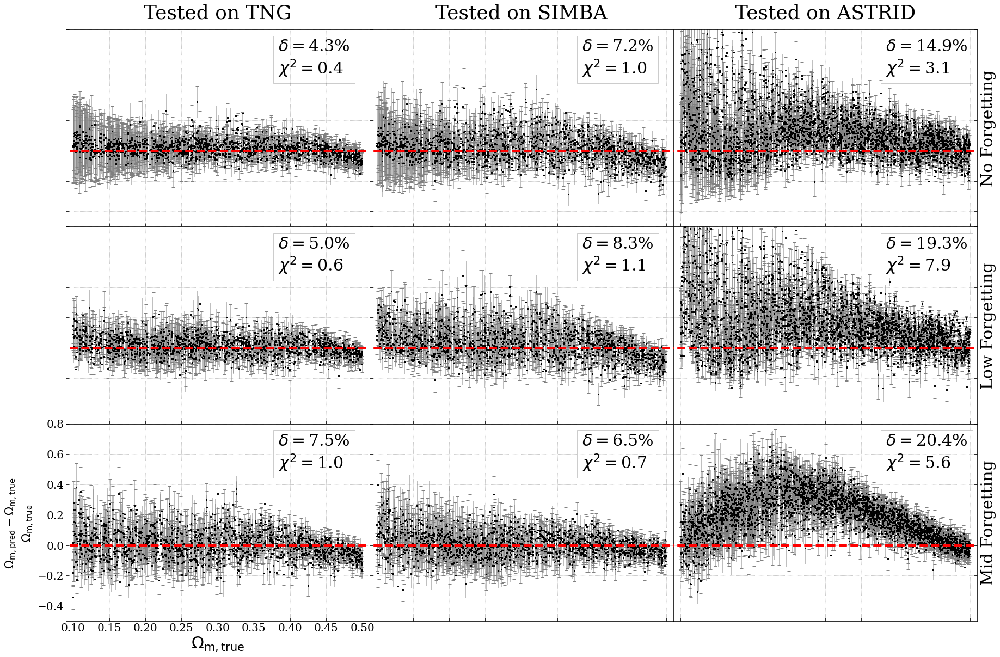

In [21]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 0 # sigma_8
ideal1 = np.linspace(0.0,0.6,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\Omega_\mathrm{m, true}$")
            axes[i,j].set_ylabel(r"$\frac{\Omega_\mathrm{m, pred}-\Omega_\mathrm{m, true}}{\Omega_\mathrm{m, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.09,0.51)
        axes[i,j].set_ylim(-.5,.8)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_T_performance_om.png',dpi=200, bbox_inches='tight')

#### Plot for $\sigma_8$

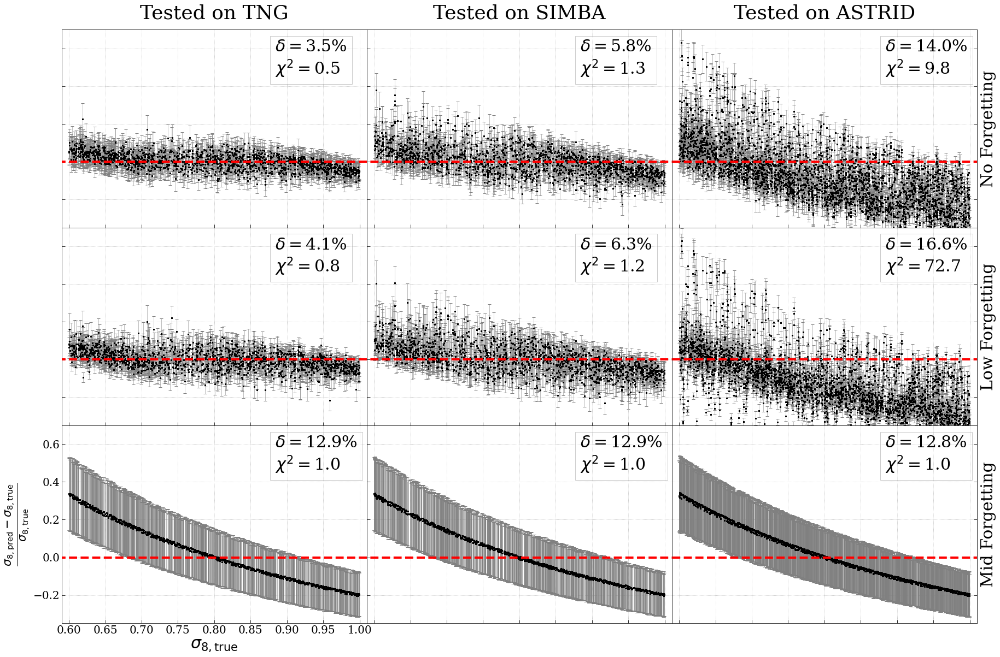

In [22]:
plt.rcParams['font.size'] = 30
plt.rcParams['axes.labelsize'] = 30
plt.rcParams['xtick.labelsize'] = 20
plt.rcParams['ytick.labelsize'] = 20
plt.rcParams['font.family']='serif'
X, Y = 3,3
fig, axes = pu.generateAxesForMultiplePlots(shape=(X,Y),figsize=(30,20),
                                      hspace=0.00,wspace=0.00)
#pu.remove_inner_axes(axes,(X,Y))
par = 1 # sigma_8
ideal1 = np.linspace(0.0,2,3)

index = np.arange(15000)
np.random.shuffle(index)
index = index[:3000]
data = [data_zero, data_mid, data_high]
ast  = [ast_zero, ast_mid, ast_high]
for i in range(X):
    for j in range(Y):
        if (i < 2):
            y_true = data[j][0][i][:,par]
            y_mean = data[j][1][i][:,par]
            y_std  = data[j][2][i][:,par]
        elif (i == 2):
            y_true = ast[j][0][index,par]
            y_mean = ast[j][1][0][index,par]
            y_std  = ast[j][1][1][index,par]
        y_res     = (y_mean-y_true)/y_true
        y_res_std = y_std/y_true
        
        axes[i,j].errorbar(y_true,y_res,y_res_std,linestyle="None",ecolor="grey", capsize=3,lw=0.5)#, s=1)
        axes[i,j].scatter(y_true,y_res,s=4,c='k',zorder=20,marker='s')
        axes[i,j].plot(ideal1,[0,0,0],"r",ls='--',lw=4,zorder=40)
        
        rel_err = np.mean(np.abs(y_res))*100
        xi2     = np.mean((y_mean-y_true)**2/y_std**2)
        props = dict(boxstyle='square', facecolor='white', alpha=0.2)
        text=\
f"""$\\delta=${rel_err:.1f}%
$\\chi^2=${xi2:.1f}"""
        axes[i,j].text(.7, .95, text,
         ha='left', va='top', transform=axes[i,j].transAxes,
         bbox=props)
        
        axes[i,j].tick_params(direction='in', axis='both', which='both', length=6)
        axes[i,j].grid(ls=':')
        if j == Y-1 and i == 0:
            axes[i,j].set_xlabel(r"$\sigma_\mathrm{8, true}$")
            axes[i,j].set_ylabel(r"$\frac{\sigma_\mathrm{8, pred}-\sigma_\mathrm{8, true}}{\sigma_\mathrm{8, true}}$")
        else:
            axes[i,j].set_xticklabels([])
            axes[i,j].set_yticklabels([])
        axes[i,j].set_xlim(0.59,1.01)
        axes[i,j].set_ylim(-.35,.7)
        
axes[0,0].set_title('Tested on TNG',pad=20)
axes[1,0].set_title('Tested on SIMBA',pad=20)
axes[2,0].set_title('Tested on ASTRID',pad=20)
labels = ['No Forgetting', 'Low Forgetting', 'Mid Forgetting', 'High Forgetting']
for i in range(Y):
    axes[X-1,i].yaxis.set_label_position("right")
    axes[X-1,i].yaxis.tick_right()
    axes[X-1,i].set_ylabel(labels[i])
plt.savefig('paper_plot/TNG_SIMBA_T_performance_sig.png',dpi=200, bbox_inches='tight')